In [1]:
import torch
from PIL import Image
import requests
from lavis.models import load_model_and_preprocess
import numpy as np

CUDA_VISIBIE_DIVICES = 0,1

/home/donghee/anaconda3/envs/BLIP2_py38/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2023-05-26 09:05:18.678903: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
## TODO load image

# img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png' 
# raw_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')   
# display(raw_image.resize((596, 437)))
import numpy as np

original_images = []
images = []
paths = ['/nfs_share2/code/donghee/inversecooking/data/images/test/9/1/2/6/9126297c7d.jpg', '/nfs_share2/code/donghee/inversecooking/data/images/test/9/1/2/7/91273289fb.jpg', '/nfs_share2/code/donghee/inversecooking/data/images/test/9/1/3/8/913851905f.jpg', '/nfs_share2/code/donghee/inversecooking/data/images/test/9/1/5/1/915114360b.jpg', '/nfs_share2/code/donghee/inversecooking/data/images/test/0/0/0/2/0002839c83.jpg', '/nfs_share2/code/donghee/inversecooking/data/images/test/0/0/0/3/0003967721.jpg', '/nfs_share2/code/donghee/inversecooking/data/images/test/0/0/0/4/0004a1d74e.jpg', '/nfs_share2/code/donghee/inversecooking/data/images/test/0/0/0/4/0004d32dec.jpg', '/nfs_share2/code/donghee/inversecooking/data/images/test/0/0/0/4/00049b8b85.jpg']
ids = []
for p in paths:
    image = Image.open(p).convert('RGB')
    images.append(image)
    original_images.append(image)
    ids.append(p.split('/')[-1])

print(len(images))

9


In [ ]:
import json

with open('/nfs_share2/code/donghee/inversecooking/snapme/snapme.json', 'r') as f:
    im2ingr = json.load(f)

In [ ]:
## snapme

import numpy as np

original_images = []
images = []
paths = ['/nfs_share2/code/donghee/inversecooking/snapme/snapme_mydb/00aed7f846529795993f19942c0d.jpeg', '/nfs_share2/code/donghee/inversecooking/snapme/snapme_mydb/0b90e149404986da7d5930438421.jpeg', '/nfs_share2/code/donghee/inversecooking/snapme/snapme_mydb/0b4297584ab4a5813c4664fde485.jpeg', '/nfs_share2/code/donghee/inversecooking/snapme/snapme_mydb/0d96e4264601b476277c7ee51232.jpeg', '/nfs_share2/code/donghee/inversecooking/snapme/snapme_mydb/0d0258474903a20af0b59f165e3d.jpeg']
ids = []
for p in paths:
    image = Image.open(p).convert('RGB')
    images.append(image)
    original_images.append(image)
    ids.append(p.split('/')[-1])

print(len(images))

In [2]:
# setup device to use
device = torch.device("cuda") if torch.cuda.is_available() else "cpu"
device

device(type='cuda')

In [ ]:
from omegaconf import OmegaConf
from lavis.common.registry import registry
from lavis.models import load_preprocess

# model_cls = registry.get_model_class("blip2_opt")
model_cls = registry.get_model_class("blip2_vicuna_instruct")
model = model_cls(img_size=224,vit_precision="fp16",freeze_vit=True)
# model.load_checkpoint("/nfs_share2/code/donghee/LAVIS/lavis/output/BLIP2/Pretrain_stage2/20230516075/checkpoint_9.pth")
model.eval()
# cfg = OmegaConf.load(model_cls.default_config_path("pretrain_opt2.7b"))
cfg = OmegaConf.load(model_cls.default_config_path("blip2_instruct_vicuna7b"))
preprocess_cfg = cfg.preprocess
vis_processors, txt_processors = load_preprocess(preprocess_cfg)
model.to(device)

In [ ]:
model = load_model("blip2_vicuna_instruct", "vicuna7b")

In [3]:
# we associate a model with its preprocessors to make it easier for inference.
# model, vis_processors, _ = load_model_and_preprocess(
#     name="blip2_t5", model_type="pretrain_flant5xxl", is_eval=True, device=device
# )

# Other available models:
# 
model, vis_processors, _ = load_model_and_preprocess(
    name="blip2_opt", model_type="pretrain_opt2.7b", is_eval=True, device=device
) ## opt2.7b, 6.7b


# model, vis_processors, _ = load_model_and_preprocess(
#     name="blip2_vicuna_instruct", model_type="vicuna13b", is_eval=True, device=device
# ) ## vicuna7b, vicuna13b

# model, vis_processors, _ = load_model_and_preprocess(
#     name="blip2_opt", model_type="pretrain_opt6.7b", is_eval=True, device=device
# )
# model, vis_processors, _ = load_model_and_preprocess(
#     name="blip2_opt", model_type="caption_coco_opt2.7b", is_eval=True, device=device
# )
# model, vis_processors, _ = load_model_and_preprocess(
#     name="blip2_opt", model_type="caption_coco_opt6.7b", is_eval=True, device=device
# )
#
# model, vis_processors, _ = load_model_and_preprocess(
#     name="blip2_t5", model_type="pretrain_flant5xl", is_eval=True, device=device
# )
#
# model, vis_processors, _ = load_model_and_preprocess(
#     name="blip2_t5", model_type="caption_coco_flant5xl", is_eval=True, device=device
# )

vis_processors.keys()

dict_keys(['train', 'eval'])

In [ ]:
model.load_checkpoint('/nfs_share2/code/donghee/LAVIS/lavis/output/BLIP2/Pretrain_stage2/20230525191/checkpoint_10.pth') ## ingr only
model.eval()

Blip2OPT(
  (visual_encoder): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1408, kernel_size=(14, 14), stride=(14, 14))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0): Block(
        (norm1): LayerNorm((1408,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1408, out_features=4224, bias=False)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=1408, out_features=1408, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((1408,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=1408, out_features=6144, bias=True)
          (act): GELU()
          (fc2): Linear(in_features=6144, out_features=1408, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
        )
      )
      (1): Block(
        (norm1): L

In [ ]:
images = [vis_processors["eval"](image).unsqueeze(0).to(device) for image in images]

## from scratch

In [7]:
import pickle

dataset = pickle.load(open('/nfs_share2/code/donghee/inversecooking/data/recipe1m_test.pkl', 'rb'))

im2inst = dict()

for entry in dataset:
    for img in entry['images']:
        img_id = img
        ingr = entry['ingredients']
        inst = entry['instructions']
        im2inst[img_id] = {
            'ingredients': ingr,
            'instructions': inst
        }
    


In [ ]:
## generate caption using beam search
from matplotlib import pyplot as plt

generate_answers = []
ingr_answers = []
recipe_answers = []
for image in images:
    answer = model.generate({"image": image}, max_length=100, min_length=1)
    generate_answers.append(answer)
    ingr_answer = model.generate({"image": image, "prompt": 'Question: What are the ingredients I need to make this food? Answer:'}, max_length=100, min_length=1)
    ingr_answers.append(ingr_answer)

    ## only for zeroshot (recipe)
    # recipe_answer = model.generate({"image": image, "prompt": 'Question: Describe the steps to make this dish. Answer:'}, max_length=150, min_length=1)
    # recipe_answer = model.generate({"image": image, "prompt": 'Question: How to cook this dish? Answer:'}, max_length=100, min_length=1)
    # recipe_answers.append(recipe_answer)
    # recipe_answer = model.generate({"image": image, "prompt": 'Question: Describe the step-by-step recipe instructions to make this food. Answer:'}, max_length=150, min_length=1)
    # # recipe_only = model.generate({"image": image, "prompt": 'Question: What are the possible steps to make this food? Answer:'}, max_length=100, min_length=1)
    # recipe_answers.append(recipe_answer)

In [18]:
## generate caption using beam search
from matplotlib import pyplot as plt

generate_answers = []
recipe_answers = []
recipe_onlys = []
for image in images:
    answer = model.generate({"image": image}, max_length=100, min_length=1)
    generate_answers.append(answer)

    # ## only for zeroshot (ingredient)
    # generate_answer = model.generate({"image": image, "prompt": 'Question: What are the ingredients I need to make this food? Answer:'}, max_length=100, min_length=1)
    # # recipe_answer = model.generate({"image": image, "prompt": 'Question: How to cook this dish? Answer:'}, max_length=100, min_length=1)
    # generate_answers.append(generate_answer)
    # recipe_answer = model.generate({"image": image, "prompt": 'Question: Describe the steps to make this dish. Answer:'}, max_length=100, min_length=1)
    # recipe_answers.append(recipe_answer)
    # # recipe_only = model.generate({"image": image, "prompt": 'Question: Describe the step-by-step recipe instructions to make this food. Answer:'}, max_length=100, min_length=1)
    # # recipe_only = model.generate({"image": image, "prompt": 'What are the ingredients and quantity of each of them I need to make this food? Answer:'}, max_length=100, min_length=1)
    # # recipe_onlys.append(recipe_only)

===== opt 2.7b (finetuned. inst only) ====


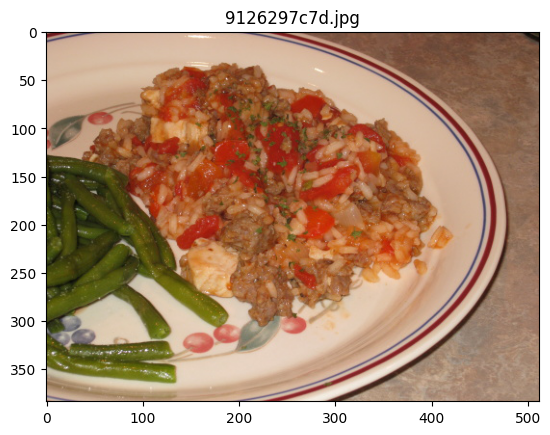

- Predicted recipe:  ['This is a step-by-step recipe instruction:preheat oven to 350 degrees in a large skillet, brown ground beef, onion, and garlic over medium heat until meat is no longer pink stir in tomato sauce, rice, and water bring to a boil, reduce heat, cover, and simmer for 20 minutes or until rice is tender stir in']
- GT (recipe):  ['heat the olive oil to medium heat in a large skillet and saute the sausage, onion and peppers for about 10 minutes or until the vegetables are tender.', 'add the garlic and cook, stirring constantly, for 30 seconds.', 'add the chicken broth and bring to a boil.', 'stir in the rice and cajun seasoning.', 'reduce heat to low, cover, and cook, stirring occasionally, for 25 minutes.', 'stir in tomatoes and cooked shredded chicken; cook, uncovered, 10 minutes, stirring occasionally.', 'remove from heat and stir in parsley.']

- Predicted ingredients:  ['In a large skillet, brown the ground beef, onion, and garlic over medium heat until meat is no l

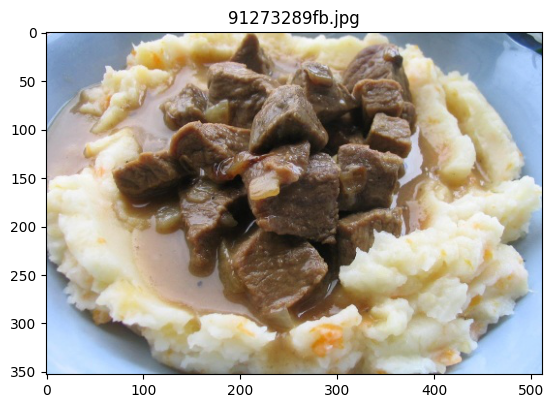

- Predicted recipe:  ['This is a step-by-step recipe instruction:preheat oven to 350f in a large skillet over medium-high heat, brown the beef in the oil add the onion and garlic and cook, stirring occasionally, until the onion is translucent add the flour and cook, stirring constantly, until the flour is completely incorporated add the beef broth, water,']
- GT (recipe):  ['place the cubed beef in a medium sized pot.', 'add water.', 'include the bouillon cube.', 'cover and simmer for 1 hour.', 'separate the meat from the broth and keep the liquid hot.', 'in a skillet on medium heat melt the butter, saute the onions until transparent then add garlic.', 'continue until you can just smell the garlic aroma.', 'sprinkle in the flour and cook until slightly brown.', 'using a whisk, pour in the hot broth until the sauce is smooth and thickened.', 'place the meat in the gravy and continue cooking covered on low for another 1/2 hour.', 'peak in and stir every so often adding water if needed to

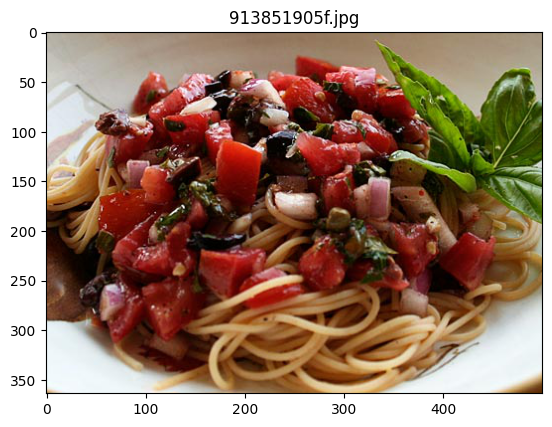

- Predicted recipe:  ['This is a step-by-step recipe instruction:bring a large pot of salted water to a boil add the pasta and cook according to package directions while the pasta is cooking, heat the olive oil in a large skillet over medium-high heat add the onion and cook, stirring occasionally, until softened, about 5 minutes add the']
- GT (recipe):  ['chop tomatoes coarsely.', 'finely chop onion and olives.', 'mince the garlic.', 'combine tomatoes, onion, olives, garlic, parsley, basil, capers, hot pepper, and oregano.', 'drizzle vinegar over tomato mixture, then pour over oil.', 'mix well and let sit at least 6 hours covered.', 'just before serving, cook the spaghetti until al dente.', 'drain and mix immediately with the sauce.', 'serve at once, offering cheese if desired.', 'variations: this pasta is also great topped with fresh grilled tuna.', 'for 4 people, use a tuna steak of about 1 1/2 pounds in size.', 'lightly grill so that some pink remains, and cut into 1 1/2 inch cubes

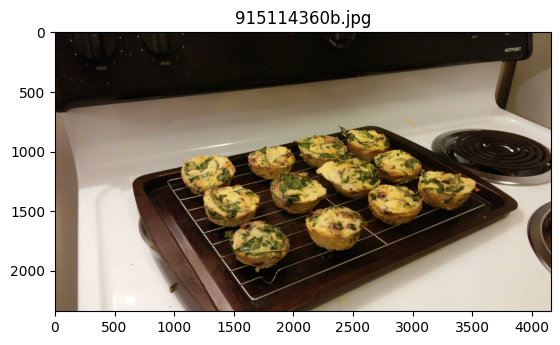

- Predicted recipe:  ['This is a step-by-step recipe instruction:preheat oven to 350 spray a muffin tin with nonstick cooking spray in a large bowl, whisk together eggs, milk, salt, pepper, garlic powder, onion powder, and cayenne pepper in a small bowl, whisk together flour, baking powder, salt, and cayenne pepper in a small bowl, whisk together sour cream, cheese, and']
- GT (recipe):  ['preheat oven to 350!', 'spray your muffin pan with non stick spray.', 'i use an olive oil spray.', 'crack open and beat all 12 eggs in a big bowl along with the milk and water.', 'once mixed, add chopped spinach, mushrooms, shredded carrots, zucchini, cheese, salt and pepper.', 'stir together slowly but making sure all ingredients are mixed well.', 'using a soup ladle, add mixture to muffin tins.', 'try not fill all the way to the top.', 'place in oven and bake for 20-25 min.', 'let sit for 5 when done in the muffin tin.?', 'mine are a little sloppy because i over filled.', 'after cooling flip over o

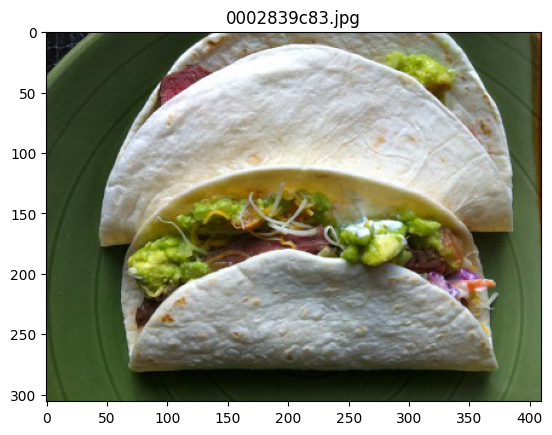

- Predicted recipe:  ['This is a step-by-step recipe instruction:in a small bowl, combine all of the ingredients for the marinade for the steak place the steak in the marinade and let it marinate for at least 30 minutes, or up to 4 hours in a large bowl, combine all of the ingredients for the guacamole for the guacamole,']
- GT (recipe):  ['slaw: in a medium sized bowl, combine slaw mix or cabbage, lime juice, garlic, mayonnaise and sugar; season with salt and pepper.', 'let stand in the refrigerator until needed.', 'steak: heat broiler to high, with rack approximately 4 inches from the heat.', 'line the bottom of a broiler pan with foil.', 'season both sides of steaks with cumin and salt and pepper to taste (you can add any other seasoning of your choice).', 'place steaks on broiler pan and broil 6 to 8 minutes for medium rare.', 'transfer steaks to a cutting board; cover loosely with foil, and let rest 5 minutes.', 'slice thinly crosswise.', 'assemble tacos by adding steak slices int

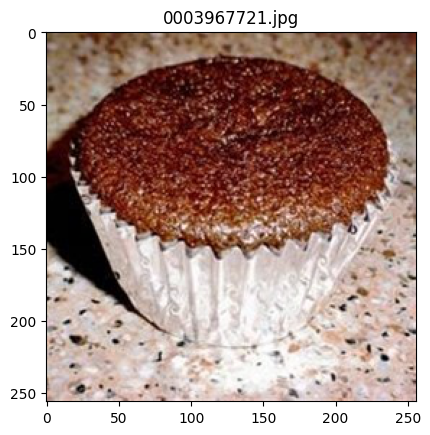

- Predicted recipe:  ['This is a step-by-step recipe instruction:preheat oven to 350 degrees f 175 degrees c grease and flour a 9x13 inch pan in a large bowl, cream together the butter and sugar until light and fluffy add the eggs one at a time, beating well after each addition sift together the flour, baking soda, and salt']
- GT (recipe):  ['preheat oven to 350 degrees f (175 degrees c).', 'line 24 muffin cups with paper liners.', 'in a large bowl, mix together flour, 2 cups sugar, cocoa, 1 teaspoon salt and baking soda.', 'stir in oil, water, vinegar and vanilla until blended.', 'pour mixture into prepared muffin cups, filling each 2/3 full.', 'to make the filling: in a medium bowl, beat together the cream cheese, egg, 1/2 cup sugar and 1/4 teaspoon salt until light and fluffy.', 'stir in chocolate chips.', 'drop a heaping teaspoonful of the cream cheese mixture into each cupcake.', 'bake in the preheated oven for 25 minutes.', 'allow to cool.']

- Predicted ingredients:  ['1 1/2 cu

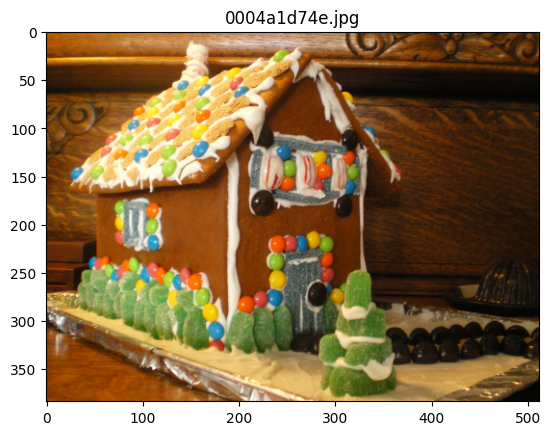

- Predicted recipe:  ['This is a step-by-step recipe instruction:in a large bowl, cream butter and sugar until light and fluffy add eggs, one at a time, beating well after each addition sift together flour, baking soda, and salt add dry ingredients to creamed mixture alternately with milk, beating well after each addition sift together flour, baking soda, and salt']
- GT (recipe):  ['in a medium saucepan, heat sugar, molasses, ginger, allspice, cinnamon, and cloves to boiling, stirring occasionally.', 'remove from heat; stir in soda (it will foam up).', 'stir in margarine till melted.', 'with a fork, stir in egg, then flour.', 'on a floured surface, knead dough till mixed.', 'divide dough in half, wrap half with plastic wrap; set aside.', 'roll half the dough, with a rolling pin, slightly thinner than 1/4 inch.', 'cut with cutters.', 'bake at 325f on a cookie sheet for 12 minutes; cool on a wire rack.', 'makes about 3 dozen 3" gingerbread people.', 'note: we make houses by cutting out 

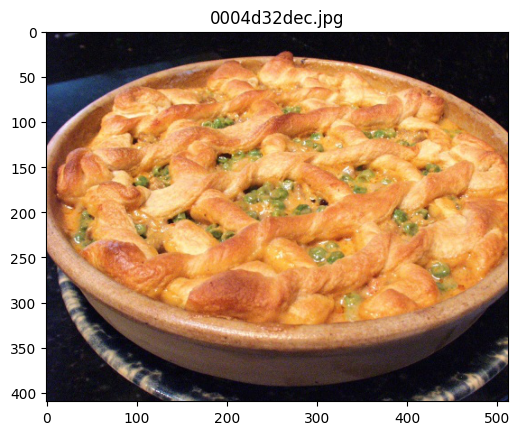

- Predicted recipe:  ['This is a step-by-step recipe instruction:preheat oven to 375f in a large skillet over medium heat, saute the onion, celery, and garlic until the onion is translucent and the celery and garlic are tender stir in the flour and cook for 1 minute stir in the milk, chicken broth, salt, pepper, and cayenne pepper cook and stir']
- GT (recipe):  ['heat the oil in a large skillet.', 'add sausage and crumble.', 'saute over medium heat until cooked through.', 'add pasta sauce, water, and peas and bring to a boil.', 'pour into a pie plate.', 'unroll and separate breadsticks.', 'place 6 of the breadsticks across the pie plate over the sausage mixture, twisting each one and spacing evenly.', 'place the remaining 6 breadsticks over the first in the opposite direction, creating a lattice pattern.', 'trim ends if needed.', 'bake at 375 degrees for 25 minutes.']

- Predicted ingredients:  ['In a large skillet over medium heat, saute the onion, celery, and garlic in the olive oil

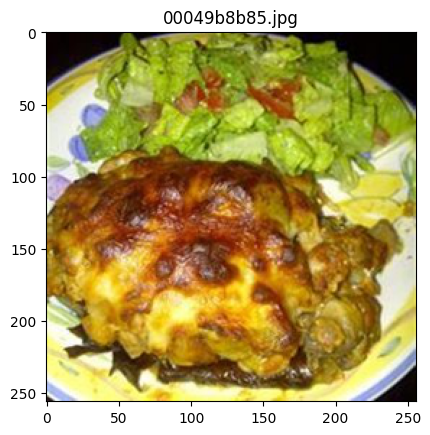

- Predicted recipe:  ['This is a step-by-step recipe instruction:preheat oven to 350 degrees f 175 degrees c lightly grease a 9x13-inch baking dish heat the olive oil in a large skillet over medium-high heat add the onion and garlic and cook, stirring occasionally, until the onion is translucent, about 5 minutes add the mushrooms and cook, stirring occasionally,']
- GT (recipe):  ['preheat oven to 350 degrees f (175 degrees c).', 'scoop out the flesh of the eggplant, chop, and reserve.', 'season shells with salt and pepper, and coat with some olive oil; set aside.', 'heat 1/4 cup olive oil in a large, deep skillet over medium high heat.', 'saute sausage and garlic until sausage is evenly brown.', 'stir in the reserved chopped eggplant.', 'season with parsley, salt and pepper.', 'pour in wine, and cook 5 minutes.', 'mix in the bread crumbs and 1/4 cup parmesan cheese.', 'if mixture is dry, stir in more olive oil.', 'stuff mixture into eggplant shells, and sprinkle top with remaining par

In [ ]:
from matplotlib import pyplot as plt

for i in range(len(images)):
    print("===== opt 2.7b (finetuned. SNAPMe) ====")
    plt.imshow(original_images[i])
    plt.title(ids[i])
    plt.show()
    print("- Predicted ingredients: ", ingr_answers[i])
    print("- GT (ingredients): ", im2ingr[ids[i]]['GT_inverse'])
    print()
    
    
    # print(recipe_onlys[i])

=====


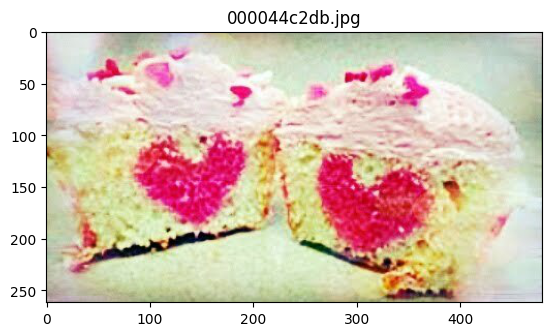

['two cupcakes with pink frosting and hearts on them']
['I have no idea how to cook this dish, but I can tell you how to make the frosting. The frosting can be made in']
['You can find the step-by-step recipe instructions for this food on our website. You can find the step-by-step recipe instructions']
=====


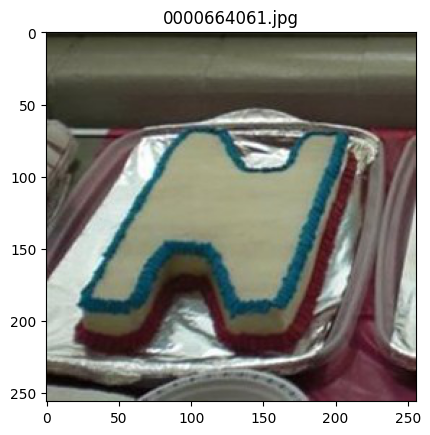

['three cakes with the letter n on top of them']
['bake it on a baking sheet in a preheated oven at 350 degrees for 30 minutes or until a toothpick inserted in the center comes out']
["I'm not sure, but I'm sure you can find them on the internet"]
=====


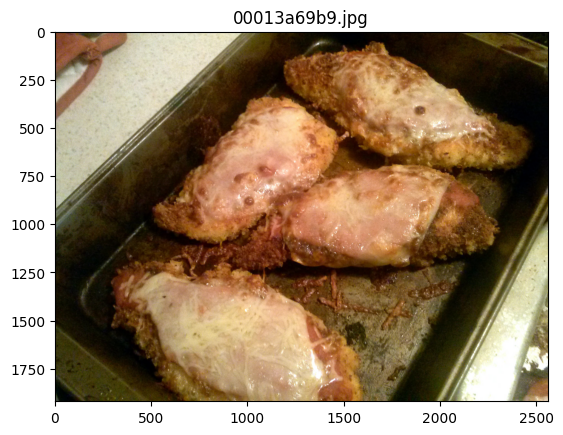

['four pieces of chicken covered in cheese in a baking pan']
['Cook the chicken in the oven at 350 degrees for about 30 minutes, or until the chicken is cooked through and the cheese is melted.']
['http://www.thekitchn.com/recipe/chicken-panko-crispy-baked-chicken']
=====


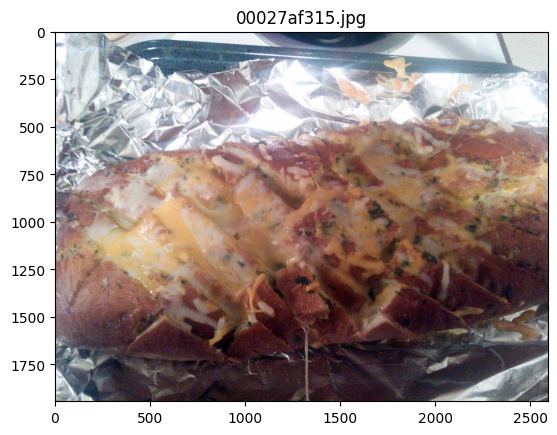

['a loaf of bread sitting on aluminum foil']
['bake it in the oven']
["I don't have any step-by-step recipe instructions for this food"]
=====


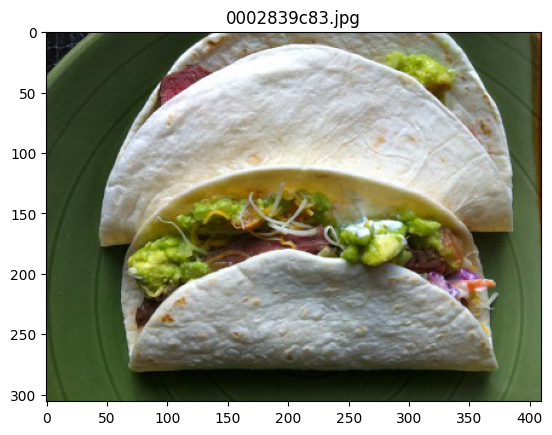

['two tacos are sitting on a green plate']
['Cook the steak on the grill, then wrap it in a flour tortilla with guacamole, cilantro, and sour cream']
['the recipe instructions are at the bottom of the page']
=====


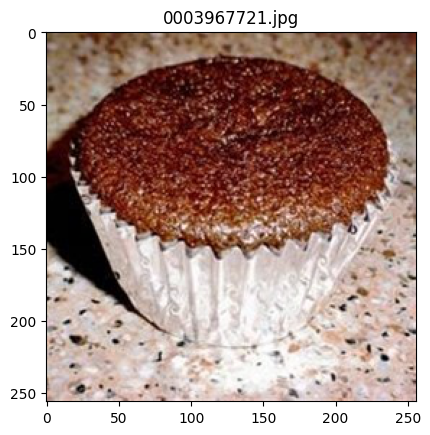

['a chocolate cupcake sitting on top of a counter']
['This recipe calls for baking the cupcakes in muffin tins, but you can also bake the cupcakes in a muffin pan.']
['http://www.foodnetwork.com/recipes/step-by-step-recipe-for-chocolate-cupcakes/']
=====


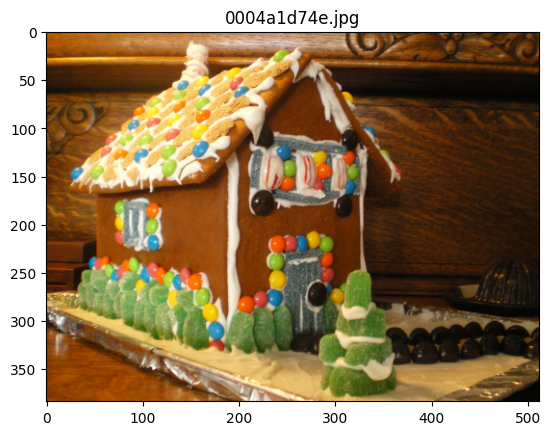

['a gingerbread house made to look like a gingerbread house']
['This is a gingerbread house made of gingerbread and decorated with candied fruit and candied nuts. The gingerbread house is decorated with cand']
['This is a gingerbread house made with gingerbread, candied ginger, candied pecans, candied walnuts, and candied']
=====


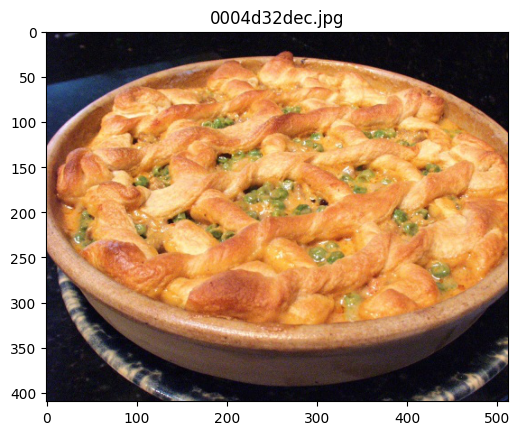

['a casserole dish filled with food sitting on top of a table']
['bake it in a casserole dish']
['http://www.foodnetwork.com/recipes/food-network-recipes/food-network-recipes/chicken-']
=====


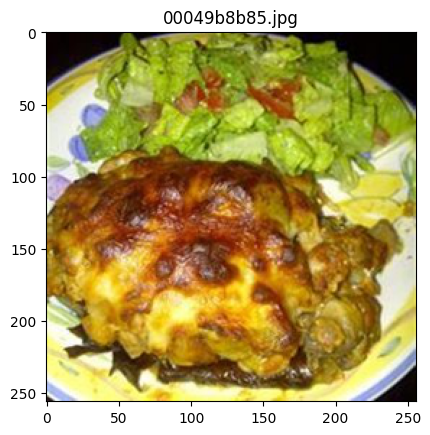

['chicken enchilada casserole']
['This dish can be cooked in the oven, on the grill, or in the crock pot. It can also be cooked in the microwave.']
['http://www.foodnetwork.com/recipes/step-by-step-recipe-how-to-make-chicken']


In [37]:
from matplotlib import pyplot as plt

for i in range(len(images)):
    print("=====")
    plt.imshow(original_images[i])
    plt.title(ids[i])
    plt.show()
    print(generate_answers[i])
    print(recipe_answers[i])
    print(recipe_onlys[i])

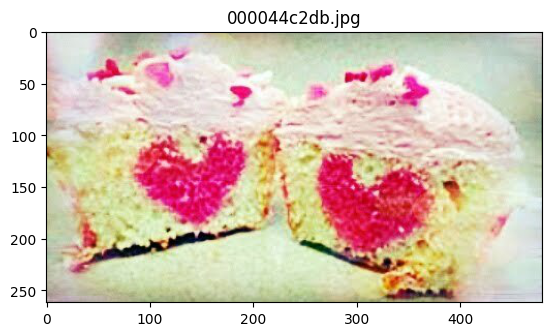

** GT : 
 - Ingredients: ['butter', 'caster_sugar', 'plain_flour', 'baking_powder', 'cornflour', 'rice_milk', 'strawberry_extract', 'food_coloring', 'eggs', 'butter', 'caster_sugar', 'plain_flour', 'baking_powder', 'rice_milk', 'extract', 'eggs']
** Prediction: 
 ['This is a food made with all_-_purpose_flour, baking_powder, baking_soda, salt, unsalted_butter']


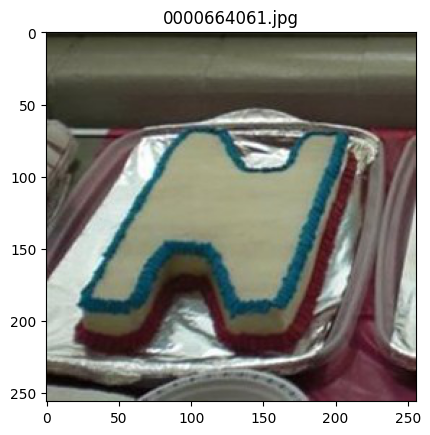

** GT : 
 - Ingredients: ['white_cake_mix', 'all_-_purpose_flour', 'white_sugar', 'salt', 'water', 'sour_cream', 'vegetable_oil', 'almond_extract', 'vanilla_extract', 'egg_whites']
** Prediction: 
 ['This is a food made with all_-_purpose_flour, white_sugar, baking_powder, baking_soda, salt,']


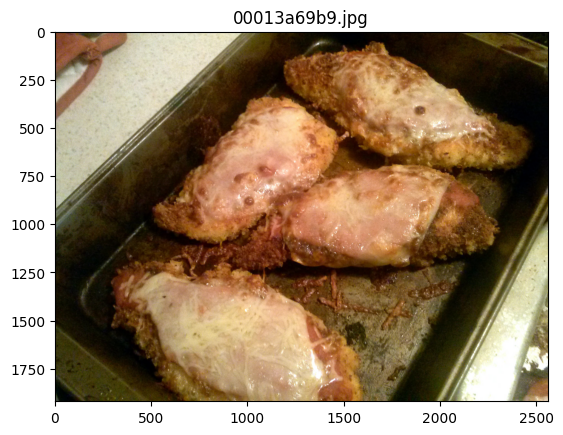

** GT : 
 - Ingredients: ['boneless_skinless_chicken_breasts', 'italian_seasoned_breadcrumbs', 'romano_cheese', 'garlic_powder', 'eggs', 'flour', 'olive_oil', 'butter', 'mozzarella_cheese', 'marinara_sauce']
** Prediction: 
 ['This is a food made with boneless_skinless_chicken_breasts, eggs, flour, parmesan_cheese,']


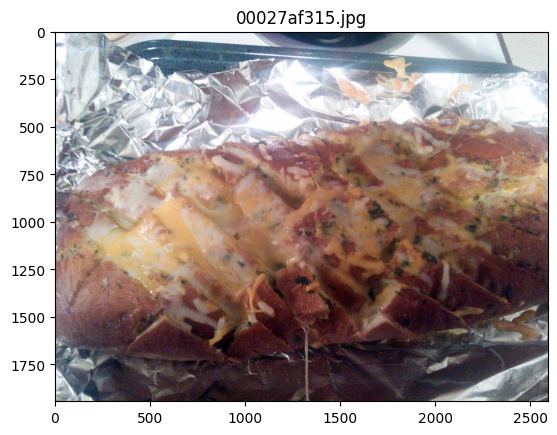

** GT : 
 - Ingredients: ['italian_bread', 'butter', 'olive_oil', 'onions', 'garlic_cloves', 'dijon_mustard', 'poppy_seeds', 'parsley', 'cheese']
** Prediction: 
 ['This is a food made with italian_bread, butter, garlic_cloves, parmesan_cheese, green_onions']


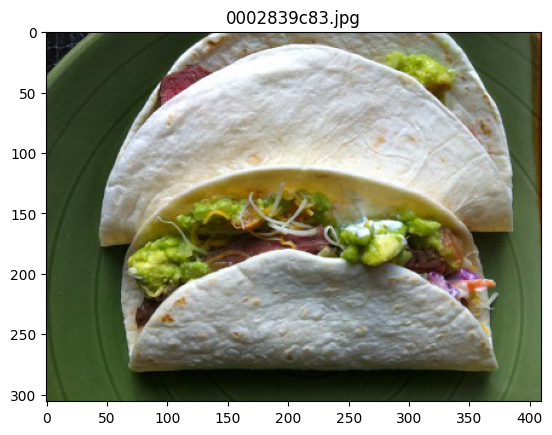

** GT : 
 - Ingredients: ['flat_iron_steaks', 'ground_cumin', '-_inch_flour_tortillas', 'mexican_blend_cheese', 'sour_cream', 'red_cabbage', 'fresh_lime_juice', 'garlic_clove', 'mayonnaise', 'sugar', 'salt_and_pepper']
** Prediction: 
 ['This is a food made with flour_tortillas, fresh_cilantro, lime_juice, salt_and_pepper']


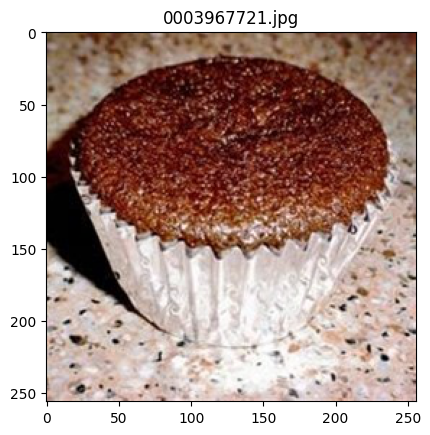

** GT : 
 - Ingredients: ['all_-_purpose_flour', 'white_sugar', 'unsweetened_cocoa_powder', 'salt', 'baking_soda', 'vegetable_oil', 'water', 'vinegar', 'vanilla_extract', 'cream_cheese', 'egg', 'white_sugar', 'salt', 'semi_-_sweet_chocolate_chips']
** Prediction: 
 ['This is a food made with all_-_purpose_flour, unsweetened_cocoa_powder, baking_soda, salt']


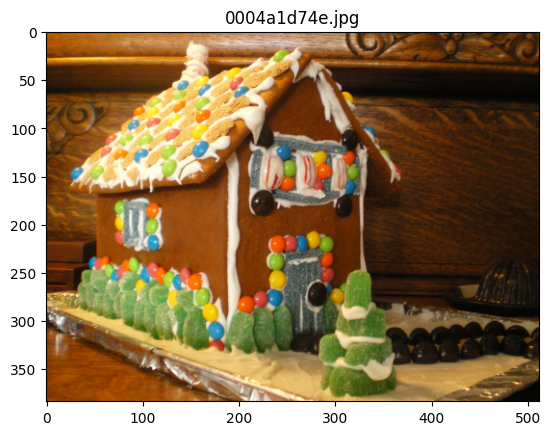

** GT : 
 - Ingredients: ['sugar', 'molasses', 'ginger', 'allspice', 'cinnamon', 'cloves', 'baking_soda', 'margarine', 'egg', 'all_-_purpose_flour']
** Prediction: 
 ['This is a food made with all_-_purpose_flour, baking_soda, salt, ground_cinnamon, ground_nutmeg']


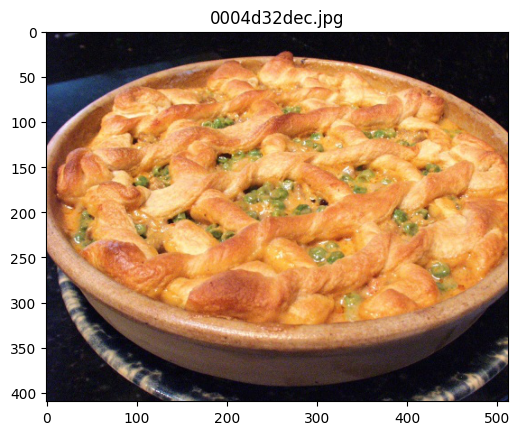

** GT : 
 - Ingredients: ['olive_oil', 'sweet_italian_turkey_sausage', 'sun_-_dried_tomato_alfredo_sauce', 'water', 'frozen_green_peas', 'refrigerated_breadstick_dough']
** Prediction: 
 ['This is a food made with cooked_chicken_breasts, frozen_mushroom_soup, cream_of_chicken']


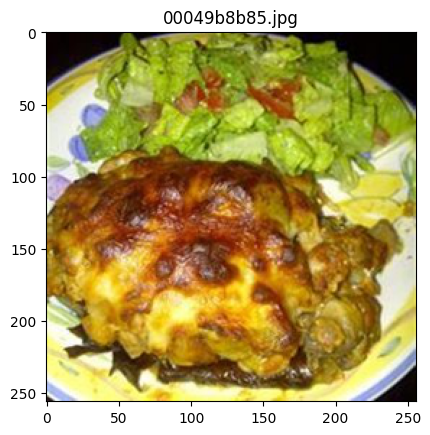

** GT : 
 - Ingredients: ['eggplant', 'salt_and_pepper', 'olive_oil', 'sweet_italian_sausage', 'garlic_cloves', 'fresh_parsley', 'white_wine', 'italian_seasoned_breadcrumbs', 'parmesan_cheese']
** Prediction: 
 ['This is a food made with boneless_skinless_chicken_breast_halves, olive_oil, garlic_cloves']


In [29]:
for answer, id, original_image in zip(generate_answers, ids, original_images):
    print("=====================")
    plt.imshow(original_image)
    plt.title(id)
    plt.show()
    # print("Image id: ", id)
    ingr = im2inst[id]['ingredients']
    inst = im2inst[id]['instructions']
    # gt = f'- Ingredients: {ingr} \n - Recipe instructions: {inst}'
    gt = f'- Ingredients: {ingr}'
    print("** GT : \n",gt)
    print("** Prediction: \n", answer)

In [ ]:
instruct_answers = []
for image in images:
    answer = model.generate({"image": image, "prompt": "Question: What are the ingredients I need to make this food? Answer:"})
    instruct_answers.append(answer)

for answer, id, image in zip(instruct_answers, ids, images):
    print("=====================")
    # plt.imshow(image)
    # plt.title(id)
    # plt.show()
    print("Image id: ", id)
    print("Predicted ingredients: ", answer)


In [ ]:
model.generate({
    "image": image,
    "prompt": "Question: which city is this? Answer: singapore. Question: why?"})

## finetune

In [ ]:
model, vis_processors, _ = load_model_and_preprocess(
    name="blip2_opt", model_type="pretrain_opt2.7b", is_eval=True, device=device)

vis_processors.keys()

model.load_checkpoint('/nfs_share2/code/donghee/LAVIS/lavis/output/BLIP2/Pretrain_stage2/20230516075/checkpoint_9.pth')
model.eval()

In [ ]:
images = [vis_processors["eval"](image).unsqueeze(0).to(device) for image in images]

In [ ]:
## generate caption using beam search
from matplotlib import pyplot as plt

generate_answers = []
for image in images:
    answer = model.generate({"image": image})
    generate_answers.append(answer)

for answer, id, image in zip(generate_answers, ids, images):
    print("=====================")
    # plt.imshow(image.cpu().squeeze(0))
    # plt.title(id)
    # plt.show()
    print("Image id: ", id)
    print("Predicted ingredients: ", answer)

In [ ]:
vis_processors['eval']

In [ ]:
from data_loader import get_loader
from lavis.datasets.data_utils import Vocabulary

split = 'test'
batch_size = 128
max_eval = 4096
max_num_samples = max(max_eval, batch_size) if split == 'val' else -1

data_loaders = {}
datasets = {}

data_loaders[split], _ = get_loader('/nfs_share2/code/donghee/inversecooking/data', '/nfs_share2/code/donghee/inversecooking/data', split,
                                                          15,
                                                          10,
                                                          20,
                                                          5,
                                                          vis_processors['eval'], batch_size,
                                                          shuffle=split == 'train', num_workers=4,
                                                          drop_last=True,
                                                          max_num_samples=max_num_samples,
                                                          use_lmdb=True,
                                                          suff='')

In [ ]:
total_step = len(data_loaders[split])
loader = iter(data_loaders[split])

for i in range(total_step):
    img_inputs, captions, ingr_gt, img_ids, paths = next(loader)

## SNAPMe

In [30]:
model, vis_processors, _ = load_model_and_preprocess(
    name="blip2_opt", model_type="pretrain_opt2.7b", is_eval=True, device=device)

vis_processors.keys()

# model.load_checkpoint('/nfs_share2/code/donghee/LAVIS/lavis/output/BLIP2/Pretrain_stage2/20230516075/checkpoint_9.pth')
model.eval()

Blip2OPT(
  (visual_encoder): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1408, kernel_size=(14, 14), stride=(14, 14))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0): Block(
        (norm1): LayerNorm((1408,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1408, out_features=4224, bias=False)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=1408, out_features=1408, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((1408,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=1408, out_features=6144, bias=True)
          (act): GELU()
          (fc2): Linear(in_features=6144, out_features=1408, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
        )
      )
      (1): Block(
        (norm1): L

In [9]:
import os
from PIL import Image
import torch

images = []
img_ids = []
original_images = []
for dirpath, dirnames, filenames in os.walk('/nfs_share2/code/donghee/inversecooking/snapme/snapme_mydb'):
    for f in filenames:
        try:
            img_path = os.path.join(dirpath, f)
            img = Image.open(img_path).convert('RGB')
            original_images.append(img)
            # img = vis_processors['eval'](img)
            images.append(img)
            img_ids.append(f)
        except:
            print("load error")
            continue
    
# images = torch.stack(images)
print(len(images))

load error
load error
load error
load error
load error
load error
load error
load error
load error
load error
load error
load error
load error
load error
load error
1463


In [ ]:
import json

with open('/nfs_share2/code/donghee/inversecooking/snapme/snapme.json', 'r') as f:
    im2ingr = json.load(f)

with open('/nfs_share2/code/donghee/inversecooking/snapme/metrics.json', 'r') as f:
    metrics = json.load(f)

In [37]:
## generate caption using beam search
from matplotlib import pyplot as plt

generate_answers = []
# samples = {}
# samples['image'] = images
for image in images:
    answer = model.generate({'image': image})
    generate_answers.append(answer)

ValueError: not enough values to unpack (expected 4, got 3)

In [ ]:
for answer, id, original_image in zip(generate_answers, img_ids, original_images):
    print("=====================")
    print("== Zero shot ==")
    plt.imshow(original_image)
    plt.title(id)
    plt.show()
    # print("Image id: ", id)
    # ingr = im2inst[id]['ingredients']
    # inst = im2inst[id]['instructions']
    # # gt = f'- Ingredients: {ingr} \n - Recipe instructions: {inst}'
    # gt = f'- Ingredients: {ingr}'
    # print("** GT : \n",gt)
    print("** Prediction: \n", answer)

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)
samples = dict()
samples['image'] = images

In [ ]:
text_input = []
for img_id in img_ids:
    t = im2ingr[img_id]['GT_inverse']
    text_input.append(t)
text_input = torch.stack(text_input)
samples['text_input'] = text_input

In [ ]:
captions = model.generate(samples, use_nucleus_sampling = False, num_beams=5, max_length=20, min_length=1)
captions = model.generate({"image": samples['image']})

In [ ]:
import pickle
from keras.utils import to_categorical
from lavis.datasets.data_utils import Vocabulary

ingrs_vocab_v = pickle.load(open('/nfs_share2/code/donghee/inversecooking/data/recipe1m_vocab_ingrs.pkl', 'rb'))
ingr2idx = ingrs_vocab_v.word2idx

In [ ]:
from sklearn.metrics import f1_score

def get_f1(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # get the set of unique labels that appear in both lists
    labels = set(y_true) | set(y_pred)

    # calculate the true positives, false positives, and false negatives for each label
    tp = np.array([np.sum((y_true == label) & (y_pred == label)) for label in labels])
    fp = np.array([np.sum((y_true != label) & (y_pred == label)) for label in labels])
    fn = np.array([np.sum((y_true == label) & (y_pred != label)) for label in labels])

    # calculate the precision, recall, and F1 score for each label
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    f1 = 2 * (precision * recall) / (precision + recall)

    return f1

def get_iou(y_true, y_pred):
    gt_set = set(y_true)
    pred_set = set(y_pred)

    # find the intersection and union of the two sets
    intersection = gt_set.intersection(pred_set)
    union = gt_set.union(pred_set)

    # calculate the IoU or Jaccard score
    iou = len(intersection) / (len(union)+1e-06)

    return iou

In [ ]:
# name = 'BLIP2_finetuned'
name = 'BLIP2_fromscratch'
ingr_vocab_size = 1488

metrics[name] = dict()
metrics[name]['f1'] = np.array([])
metrics[name]['iou'] = np.array([])

pred_ids = []
for i in range(len(captions)):
    caption = captions[i].replace(', ', ',').replace(' ', '_')
    caption = caption.split(',')
    if len(caption[-1]) == 0:
        caption = caption[:-1]

    img_id = img_ids[i]
    im2ingr[img_id][name] = dict()
    im2ingr[img_id][name]['prediction'] = caption

    caption_id = []
    for c in caption:
        try:
            caption_id.append(ingr2idx[c])
        except:
            print("no matching ingredient")
            continue
    
    gt = im2ingr[img_id]['GT_inverse'] 
    y_true = to_categorical(gt, ingr_vocab_size-1)
    y_pred = to_categorical(caption_id, ingr_vocab_size-1)
    y_true = np.sum(y_true, axis=0)
    y_pred = np.sum(y_pred, axis=0)

    f1 = f1_score(y_true, y_pred)
    im2ingr[img_id][name]['f1'] = f1

    iou = get_iou(gt, caption_id)
    im2ingr[img_id][name]['iou'] = iou

    metrics[name]['f1'] = np.append(metrics[name]['f1'], f1)
    metrics[name]['iou'] =np.append(metrics[name]['iou'], iou)
    
metrics[name]['f1'] = metrics[name]['f1'].mean()
metrics[name]['iou'] = metrics[name]['iou'].mean()
    


In [ ]:
print(metrics)

In [ ]:
with open('/nfs_share2/code/donghee/inversecooking/snapme/metrics.json', 'w') as f:
    json.dump(metrics, f, indent=4)

with open('/nfs_share2/code/donghee/inversecooking/snapme/snapme.json', 'w') as f:
    json.dump(im2ingr, f, indent=4)

print("DONE")